<h1><center>Furniv - EDA</center></h1>
<p>As part of any data analysis process, an initial exploratory phase is required to familiarize with the data and to find new information on the issue evaluated. That is how, by reviewing and cleaning the data and by plotting different variables in diferent formats, new insight is gathered and proper modeling aproximations are proposed. 
<p></p>As so, we started reviewing the data with the idea of getting initial information on how historical sales affected the behavior of the stock and the product portfolio.</p>

# Data consolidation
<p>First we cleaned all tables to have a standarized, relevant data with no outliers, NaN values and precise working information. We also created some new fields for some tables to be able to work on differents asspects such as dates, quentities and categorical variables. Finally we merged some tables to have aditional information os the sales and current stock of the client's company.</p>

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
## Librerias
from io import StringIO as Buf
import re
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
from IPython.display import display_html
from itertools import chain,cycle
import plotly.express as px

## Funciones
def get_data():
    stock = pd.read_csv('Proyecto/Data/ExistenciasNew.csv')
    sales = pd.read_csv('Proyecto/Data/FacturacionCorregida.csv',parse_dates=['Fecha'],dayfirst=True ,sep=';')
    products = pd.read_csv('Proyecto/Data/MaestroCorregido.csv', sep=';')
    return stock, sales, products

def clean_products(products):
    products.columns = [column.upper() for column in products.columns]
    products.columns = [column.lstrip('001-') for column in products.columns]
    products.columns = [column.replace('.', '') for column in products.columns]
    products.columns = [column.replace(' ', '_') for column in products.columns]
    products.columns = [column.replace('_EXHIBIDO', '') for column in products.columns]
    products.columns = [column.replace('_UNIFICADA', '') for column in products.columns]
    products = products.rename(columns={
        'DESC_ITEM':'DESC_LARGA',
        'DESC_EXT_1_DETALLE':'DETALLE_1',
        'DESC_EXT_2_DETALLE':'DETALLE_2',
        'DESC_TIPO_INVENTARIO':'TIPO_INVENTARIO',
        'DEPARTAMENTO':'CATEGORIA',
        'MATERIAL_PPAL':'MATERIAL',
        'PUESTOS':'PUESTOS_STR',
        'NUM_PUESTOS':'PUESTOS',
        'REF_COMBINADA':'REF',
        'COLOR_DEF':'COLOR',
    })

    regex = '^([A-Z0-9]+\s\-\s)+'
    products.SUBCATEGORIA = products.SUBCATEGORIA.str.replace(regex,'',regex=True)
    products.ORIGEN = products.ORIGEN.str.replace(regex,'',regex=True)
    products.CATEGORIA = products.CATEGORIA.str.replace(regex,'',regex=True)
    products.ESTILO = products.ESTILO.str.replace(regex,'',regex=True)
    products.VIGENCIA = products.VIGENCIA.str.replace(regex,'',regex=True)
    products.MATERIAL = products.MATERIAL.str.replace(regex,'',regex=True).str.upper()
    products.ACABADO = products.ACABADO.str.upper().replace('SUPERFICIES MATE','MATE')
    products.DETALLE_1.fillna('N/A',inplace=True)
    products.DETALLE_2.fillna('N/A',inplace=True)
    products['PUESTOS'] = products.PUESTOS_STR.str.slice(stop=1).replace({'N':0,'M':7}).astype(int).replace({0:np.nan})
    products = products[['ITEM','REF','DESCRIPCION','CATEGORIA','SUBCATEGORIA','VIGENCIA','ORIGEN',
                         'ESTILO','MATERIAL','ACABADO','PUESTOS','COLOR','ANCHO','ALTO','FONDO','DESC_LARGA']]
    return products

def clean_sales(sales):
    sales.columns = [column.upper() for column in sales.columns]
    sales.columns = [column.replace('.', '') for column in sales.columns]
    sales.columns = [column.replace(' ', '_') for column in sales.columns]
    sales = sales.groupby(['CO','DESC_CO','NRO_DOCUMENTO','REF_COMBINADA','FECHA'])[['CANTIDAD_INV','SUMA_DE_VLR_BRUTO','SUMA_DE_VLR_SUBTOTAL']].sum().reset_index()
    sales['ID'] = sales['CO'].astype(str)+':'+sales['NRO_DOCUMENTO']+':'+sales['REF_COMBINADA']
    sales["DESCUENTO(%)"] = (sales['SUMA_DE_VLR_BRUTO']-sales['SUMA_DE_VLR_SUBTOTAL'])/sales['SUMA_DE_VLR_BRUTO']
    sales['PRECIO'] = sales['SUMA_DE_VLR_BRUTO']/sales['CANTIDAD_INV']
    sales['MES'] = sales['FECHA'].dt.month
    sales['ANIO'] = sales['FECHA'].dt.year
    sales['DIA'] = sales['FECHA'].dt.weekday
    sales = sales.rename(columns={
        'CO':'CODIGO_TIENDA',
        'DESC_CO':'TIENDA',
        'REF_COMBINADA':'PROD_REF',
        'CANTIDAD_INV':'CANTIDAD',
        'SUMA_DE_VLR_BRUTO':'SUBTOTAL',
        'SUMA_DE_VLR_SUBTOTAL':'TOTAL',
    })
    sales = sales[['ID','NRO_DOCUMENTO','FECHA','CODIGO_TIENDA','TIENDA','PROD_REF','CANTIDAD','PRECIO',
                   'SUBTOTAL','DESCUENTO(%)','TOTAL','ANIO','MES','DIA']]
    return sales

def clean_stock(stock):
    stock.columns = [column.upper() for column in stock.columns]
    stock.columns = [column.replace('.', '') for column in stock.columns]
    stock.columns = [column.replace(' ', '_') for column in stock.columns]
    
    stock = stock.rename(columns={
        'EXT_1_DETALLE':'DETALLE_1',
        'EXT_2_DETALLE':'DETALLE_2',
        'REF_COMBINADA':'REF',
        'REFERENCIA':'ID',
        'DISP':'CANTIDAD',
        'DEPARTAMENTO':'CATEGORIA'
    })
    
    regex = '^([A-Z0-9]+\s\-\s)+'
    stock.CATEGORIA = stock.CATEGORIA.str.replace(regex,'',regex=True)
    stock.SUBCATEGORIA = stock.SUBCATEGORIA.str.replace(regex,'',regex=True)
    
    stock = stock[['ID','REF','CANTIDAD','CATEGORIA','SUBCATEGORIA','DETALLE_1','DETALLE_2']]
    return stock

def create_merges(sales,products):
    sales_prod = sales.merge(products, left_on='PROD_REF', right_on='REF')
    stock_prod = stock.drop(columns=['CATEGORIA','SUBCATEGORIA']).merge(products, on='REF', how='left')
    return sales_prod, stock_prod

def create_subcategories_list(sales_prod):
    subcategories_list = []
    temp = sales_prod.groupby('SUBCATEGORIA')["CANTIDAD"].sum().sort_values(ascending=False)
    totalSales = temp.sum()
    pareto = totalSales*0.8
    counter = 0
    
    temp = temp.to_frame().reset_index()
    for index, row in temp.iterrows():
        counter += row["CANTIDAD"]
        subcategories_list.append(row["SUBCATEGORIA"])
        if counter >= pareto:
            break
    return subcategories_list

def create_materials_list(sales_prod):
    materials_list = sales_prod.groupby(['MATERIAL'])['CANTIDAD'].sum().sort_values(ascending=False)
    cumpperce = materials_list.cumsum()/materials_list.sum()*100
    materials_list = cumpperce[cumpperce<91].to_frame().rename(columns={'CANTIDAD':'CANTIDAD(%)'})
    return materials_list

def create_consolidated(sales_prod):
    consolidated = sales_prod.groupby('REF').aggregate(
        CANTIDAD=pd.NamedAgg(column="CANTIDAD", aggfunc="sum"),
        TOTAL=pd.NamedAgg(column="TOTAL", aggfunc="sum"), 
        PRECIO_PROMEDIO=pd.NamedAgg(column='PRECIO',aggfunc='mean'),
        DESCUENTO_PROMEDIO=pd.NamedAgg(column='DESCUENTO(%)', aggfunc= 'mean')
    ).reset_index().merge(products, on='REF').sort_values(by='CANTIDAD', ascending=False)
    return consolidated

def add_category_pos(row):
    if row["SUBCATEGORIA"] in subcategories_list:
        index = row["SUBCATEGORIA"]
    else:
        index = "OTROS"
    return index

def add_pos_cols(arr):
    arr["SUBCATEGORIA_POS"] = arr.apply(add_category_pos,axis = 1 )
    arr['COLOR_POS'] = np.where(
        arr["COLOR"].isin(['NEGRO','GRIS','CAFE', 'BLANCO','AZUL','MIEL','BEIGE','CRISTAL','ROJO','AMARILLO']),
        arr["COLOR"],
        'OTRO'
    )
    arr['MATERIAL_POS']=np.where(arr['MATERIAL'].isin(materials_list.index), arr['MATERIAL'], 'OTRO')
    return

def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str += '<th style="text-align:center"><td style="vertical-align:top">'
        html_str += f'<h4>{title}</h4>'
        html_str += df.to_html().replace('table','table style="display:inline"')
        html_str += '</td></th>'
    display_html(html_str,raw=True)
    return

def print_clean_output(df):
    buffer = Buf()
    df.info(buf=buffer)
    s = buffer.getvalue()
    s = re.sub('(\A(.*\n){3})|((\n.*\n.*){1}$)','',s)
    print(s)
    return

def last_first(x):
    try:
        a = demand.columns[np.where(x)[0][-2]][1]
    except:
        a = demand.columns[np.where(x)[0][-1]][1]
    return a

In [3]:
stock, sales, products = get_data()

products = clean_products(products)
sales = clean_sales(sales)
stock = clean_stock(stock)

sales_prod, stock_prod = create_merges(sales,products)
groupby_sales = create_consolidated(sales_prod)

subcategories_list = create_subcategories_list(sales_prod)
materials_list = create_materials_list(sales_prod)

add_pos_cols(sales_prod)
add_pos_cols(products)
add_pos_cols(stock_prod)
add_pos_cols(groupby_sales)

## Data composition

The data sent by the client is comprised by three tables `products_master` (renamed to `products`), `current_stock` (renamed to `stock`) and `sales`. From those tables, the tables `sales_prod` and `stock_prod` were created to relate the current stock and historical sales to the characteristics of each product. Finally a grouped table `groupby_sales` was created from the `sales_prod` table where each product has one row and the quantity values are aggregated for statistical analysis (`amount_sold`, `average_price`, `average_discount`, `sale_subtotal`, `sale_total` and `sale_average`). Here we can check the `.info()` values for each table.

### `products`:

In [4]:
print_clean_output(products)

 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ITEM              1285 non-null   int64  
 1   REF               1285 non-null   object 
 2   DESCRIPCION       1285 non-null   object 
 3   CATEGORIA         1285 non-null   object 
 4   SUBCATEGORIA      1285 non-null   object 
 5   VIGENCIA          1285 non-null   object 
 6   ORIGEN            1285 non-null   object 
 7   ESTILO            1285 non-null   object 
 8   MATERIAL          1285 non-null   object 
 9   ACABADO           1285 non-null   object 
 10  PUESTOS           1017 non-null   float64
 11  COLOR             1285 non-null   object 
 12  ANCHO             1285 non-null   float64
 13  ALTO              1285 non-null   float64
 14  FONDO             1285 non-null   float64
 15  DESC_LARGA        1285 non-null   object 
 16  SUBCATEGORIA_POS  1285 non-null   object 
 17  COLOR_POS         1285 non-null   object 
 18  MATERIAL_POS      1285 non-null   object 



### `sales`:

In [5]:
print_clean_output(sales)

 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ID             36050 non-null  object        
 1   NRO_DOCUMENTO  36050 non-null  object        
 2   FECHA          36050 non-null  datetime64[ns]
 3   CODIGO_TIENDA  36050 non-null  int64         
 4   TIENDA         36050 non-null  object        
 5   PROD_REF       36050 non-null  object        
 6   CANTIDAD       36050 non-null  int64         
 7   PRECIO         36050 non-null  float64       
 8   SUBTOTAL       36050 non-null  int64         
 9   DESCUENTO(%)   36050 non-null  float64       
 10  TOTAL          36050 non-null  int64         
 11  ANIO           36050 non-null  int64         
 12  MES            36050 non-null  int64         
 13  DIA            36050 non-null  int64         



### `stock`:

In [6]:
print_clean_output(stock)

 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   ID            941 non-null    object 
 1   REF           941 non-null    object 
 2   CANTIDAD      941 non-null    int64  
 3   CATEGORIA     941 non-null    object 
 4   SUBCATEGORIA  941 non-null    object 
 5   DETALLE_1     877 non-null    float64
 6   DETALLE_2     75 non-null     float64



### `sales_prod`:

In [7]:
print_clean_output(sales_prod)

 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID                36180 non-null  object        
 1   NRO_DOCUMENTO     36180 non-null  object        
 2   FECHA             36180 non-null  datetime64[ns]
 3   CODIGO_TIENDA     36180 non-null  int64         
 4   TIENDA            36180 non-null  object        
 5   PROD_REF          36180 non-null  object        
 6   CANTIDAD          36180 non-null  int64         
 7   PRECIO            36180 non-null  float64       
 8   SUBTOTAL          36180 non-null  int64         
 9   DESCUENTO(%)      36180 non-null  float64       
 10  TOTAL             36180 non-null  int64         
 11  ANIO              36180 non-null  int64         
 12  MES               36180 non-null  int64         
 13  DIA               36180 non-null  int64         
 14  ITEM              36180 non-null  int64         
 15  REF               36180 non-null  object        
 16  DESCRIPCION       36180

### `stock_prod`:

In [8]:
print_clean_output(stock_prod)

 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                943 non-null    object 
 1   REF               943 non-null    object 
 2   CANTIDAD          943 non-null    int64  
 3   DETALLE_1         879 non-null    float64
 4   DETALLE_2         75 non-null     float64
 5   ITEM              452 non-null    float64
 6   DESCRIPCION       452 non-null    object 
 7   CATEGORIA         452 non-null    object 
 8   SUBCATEGORIA      452 non-null    object 
 9   VIGENCIA          452 non-null    object 
 10  ORIGEN            452 non-null    object 
 11  ESTILO            452 non-null    object 
 12  MATERIAL          452 non-null    object 
 13  ACABADO           452 non-null    object 
 14  PUESTOS           312 non-null    float64
 15  COLOR             452 non-null    object 
 16  ANCHO             452 non-null    float64
 17  ALTO              452 non-null    float64
 18  FONDO             452 non-null    float64
 19  DESC_LAR

### `groupby_sales`:

In [9]:
print_clean_output(groupby_sales)

 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   REF                 1285 non-null   object 
 1   CANTIDAD            1285 non-null   int64  
 2   TOTAL               1285 non-null   int64  
 3   PRECIO_PROMEDIO     1285 non-null   float64
 4   DESCUENTO_PROMEDIO  1285 non-null   float64
 5   ITEM                1285 non-null   int64  
 6   DESCRIPCION         1285 non-null   object 
 7   CATEGORIA           1285 non-null   object 
 8   SUBCATEGORIA        1285 non-null   object 
 9   VIGENCIA            1285 non-null   object 
 10  ORIGEN              1285 non-null   object 
 11  ESTILO              1285 non-null   object 
 12  MATERIAL            1285 non-null   object 
 13  ACABADO             1285 non-null   object 
 14  PUESTOS             1017 non-null   float64
 15  COLOR               1285 non-null   object 
 16  ANCHO               1285 non-null   float64
 17  ALTO                1285 non-null   float64
 18  FONDO          

# Sales analysis

To continue the analysis, we started by reviewing the sales behavior to find information about the most important products for the company according to the value of the total sales and the amount of items sold. Here we can see the total value of the items sold during the last tree years.

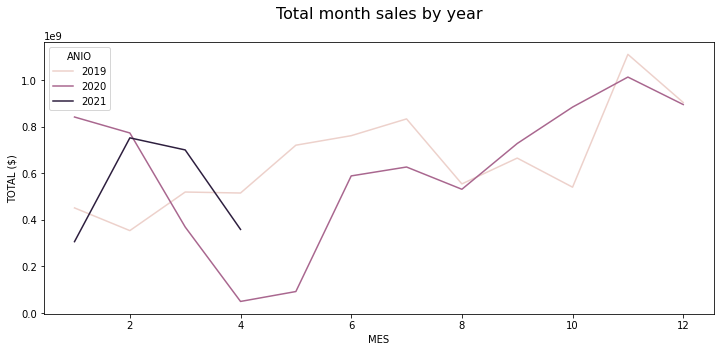

In [10]:
sales1 = sales.groupby(['ANIO','MES'])['TOTAL'].sum().to_frame().reset_index()
fig, axes = plt.subplots(1, 1,figsize=(12,5))
sns.lineplot(data=sales1, x="MES", y='TOTAL', hue="ANIO")
plt.ylabel('TOTAL ($)')
plt.title('Total month sales by year\n', fontsize=16)

plt.show()

In the graph we can see different behaviors. Fist we observe a normal year with a growing welling trend with peak during the last months of the year. The, for 2020 se wee the efects of the COVID pandemic restritions imposed by the colombian goverment during March, April and May, and then again a normal, thought slower, grouth trend to again gain a peak performance during October,  November and December. And finally we have this years data that has a cut up to April 15 which explains the low behavior of that month compared to the, presumed growth, of 2019.

In the following second graph we have the average sale value of every month. in there we confirmed the suspission that even though the pandemic affected the amount of sales made during that period, the sales that were made had a similar mean value from the previous year and the following year. Which in turn translates on the general idea that the company has a similar average sales value every month and that what changed on those initial month of the pandemic was the anmount of sales made those periods.

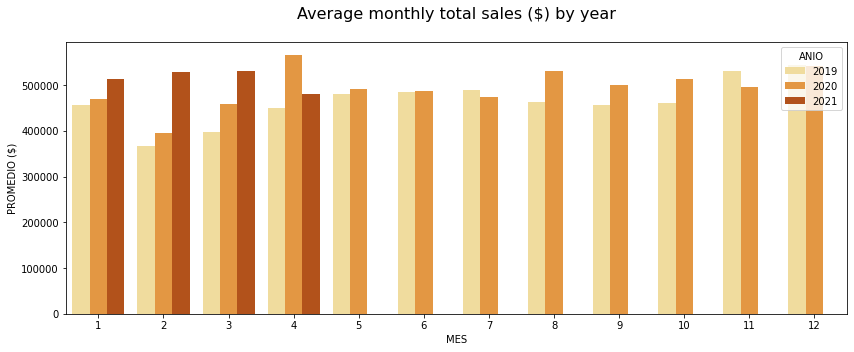

In [11]:
sales1 = sales.groupby(['ANIO','MES'])['TOTAL'].mean().to_frame().reset_index()
fig, axes = plt.subplots(1, 1,figsize=(14,5))
sns.barplot(data=sales1, x="MES", y='TOTAL', hue="ANIO",  palette="YlOrBr")
plt.ylabel('PROMEDIO ($)')
plt.title('Average monthly total sales ($) by year\n', fontsize=16)

plt.show()

In this reggard we can see that the average sales per year for the company is arround 7,600 MM. In 2019 of 7,923MM, in 2020 7,387MM and up to Arpil 2021 of 2,116MM. All of which allows us to clonclude that 2020 was, nonetheless the efects of the pandemic, a really positive and profitable year for the company. In facty the company was able to considerably recover to almost get the same values from 2019.

In relation to 2021 sales, we can also see that they have a 15% increase vs. 2019 del 15% and about 4% vs. 2020. A favorable anual company growth.

## Characterized sold portfolio

Now we start to get information on some of the characteristicas of the sold portfolio of the company. Firts we see the distribution in relation to the product origin, the store it was sold and the main sub categories sold. Then we review the general information on the most sold styles and colors.

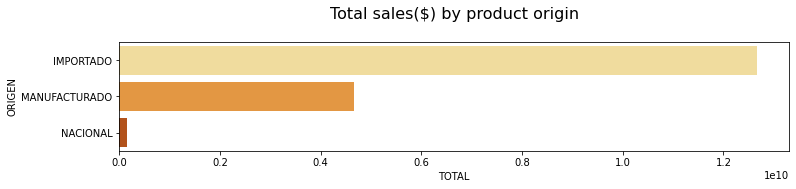

In [12]:
grafico = sales_prod.groupby('ORIGEN')['TOTAL'].sum().sort_values(ascending=False).to_frame().reset_index().head(10)
fig, axes = plt.subplots(1, 1,figsize=(12,2))
plt.xlabel('TOTAL ($)')
sns.barplot(data=grafico, y='ORIGEN', x='TOTAL', palette="YlOrBr")
plt.title('Total sales($) by product origin\n', fontsize=16)

plt.show()

We can see here that the company's sold posrtfolio is comprised of imported products, with a 68% of the sold portfolio, and fabricated prodcuts with almost 30% of the portfolio; leaving the other categories with less than 2%.

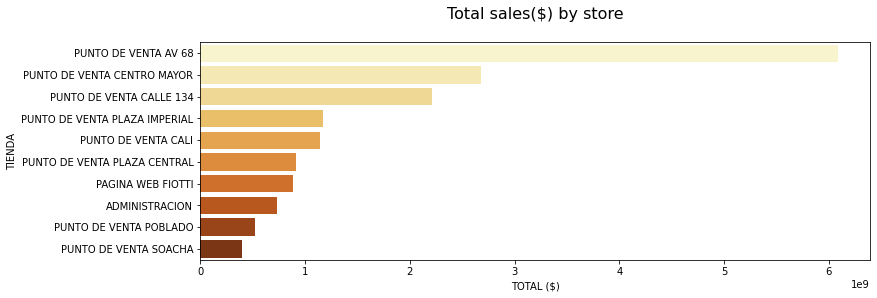

In [13]:
grafico = sales_prod.groupby('TIENDA')['TOTAL'].sum().sort_values(ascending=False).to_frame().reset_index().head(10)

fig, axes = plt.subplots(1, 1,figsize=(12,4))
plt.title('Total sales($) by store\n', fontsize=16)

sns.barplot(data=grafico, y='TIENDA', x='TOTAL', palette="YlOrBr")
plt.xlabel('TOTAL ($)')

plt.show()

In this second graph we observe that most of the sales where made in Bogotá in phisical stores (the fisrt 4 stores comprise almost the 70% of the total sold portfolio), followed by sales from Cali and the webpage.

Next, we can review that the top 13 sub categories of products sold, wich is almost 80% of the total sold portfolio, are dining and living room elements with dinning room chairs with an exsesive amount sold.

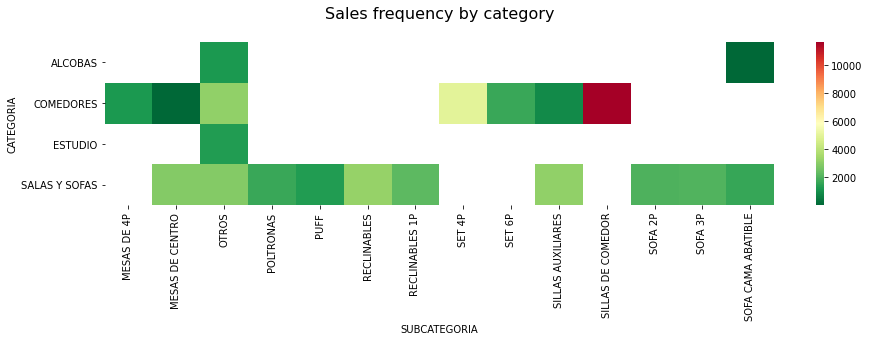

In [14]:
fig,ax=plt.subplots(figsize=(15,3))
ax.set_title('Sales frequency by category\n', fontsize=16)
sns.heatmap(pd.pivot_table(data=groupby_sales,index='CATEGORIA',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlGn_r')
plt.xlabel('SUBCATEGORIA')

plt.show()

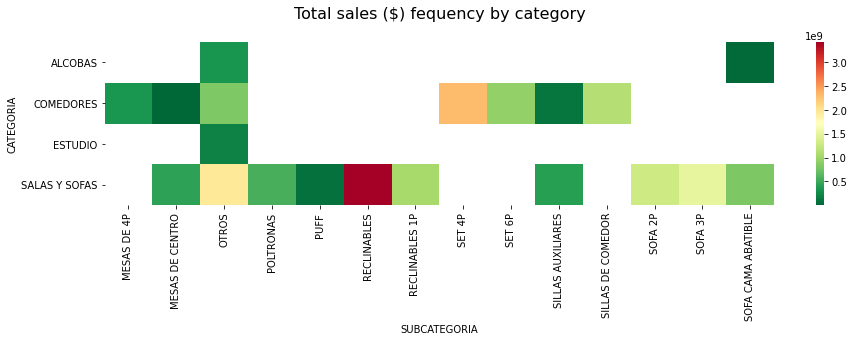

In [15]:
fig,ax=plt.subplots(figsize=(15,3))
ax.set_title('Total sales ($) fequency by category\n', fontsize=16)
sns.heatmap(pd.pivot_table(data=groupby_sales,index='CATEGORIA',columns='SUBCATEGORIA_POS',values='TOTAL',aggfunc='sum'),cmap='RdYlGn_r')
plt.xlabel('SUBCATEGORIA')

plt.show()

As we can see, althoug the heat map informs us of the general composition of the sold portfolio, we are missing information on historical trends that could impact the way we decide on the proper model. As there could be other confounding variables not taken into account. For that we decided to look for possible historical trends in each of the 13 subcategories previously mentioned.

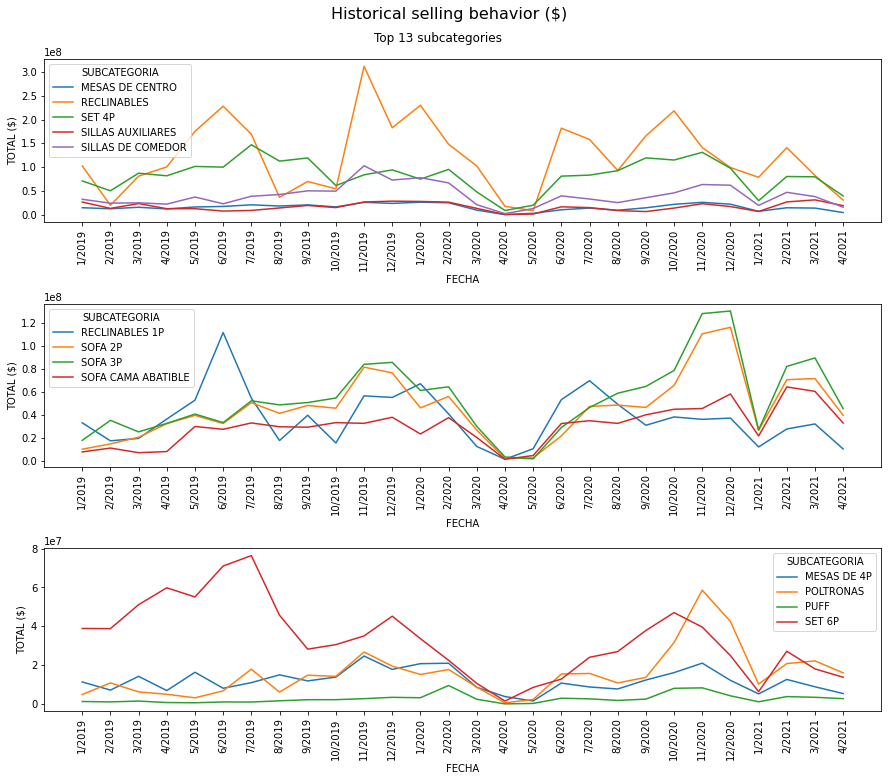

In [16]:
fig, (ax1,ax2,ax3) = plt.subplots(3, 1,figsize=(15,12),gridspec_kw={'hspace':0.5})
fig.suptitle('Historical selling behavior ($)',fontsize=16,y=0.94)
fig.text(.43,.9,'Top 13 subcategories', fontsize=12)

top5 = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[:5])]
top5 = top5.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["TOTAL"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top5["FECHA"] = top5.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax1,data=top5, x="FECHA", y="TOTAL", hue="SUBCATEGORIA")
ax1.set_ylabel('TOTAL ($)')
ax1.tick_params(axis='x', labelrotation=90)

top9 = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[5:9])]
top9 = top9.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["TOTAL"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top9["FECHA"] = top9.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax2,data=top9, x="FECHA", y="TOTAL", hue="SUBCATEGORIA")
ax2.set_ylabel('TOTAL ($)')
ax2.tick_params(axis='x', labelrotation=90)

topRest = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[9:15])]
topRest = topRest.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["TOTAL"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
topRest["FECHA"] = topRest.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax3,data=topRest, x="FECHA", y="TOTAL", hue="SUBCATEGORIA")
ax3.set_ylabel('TOTAL ($)')
ax3.tick_params(axis='x', labelrotation=90)

plt.show()

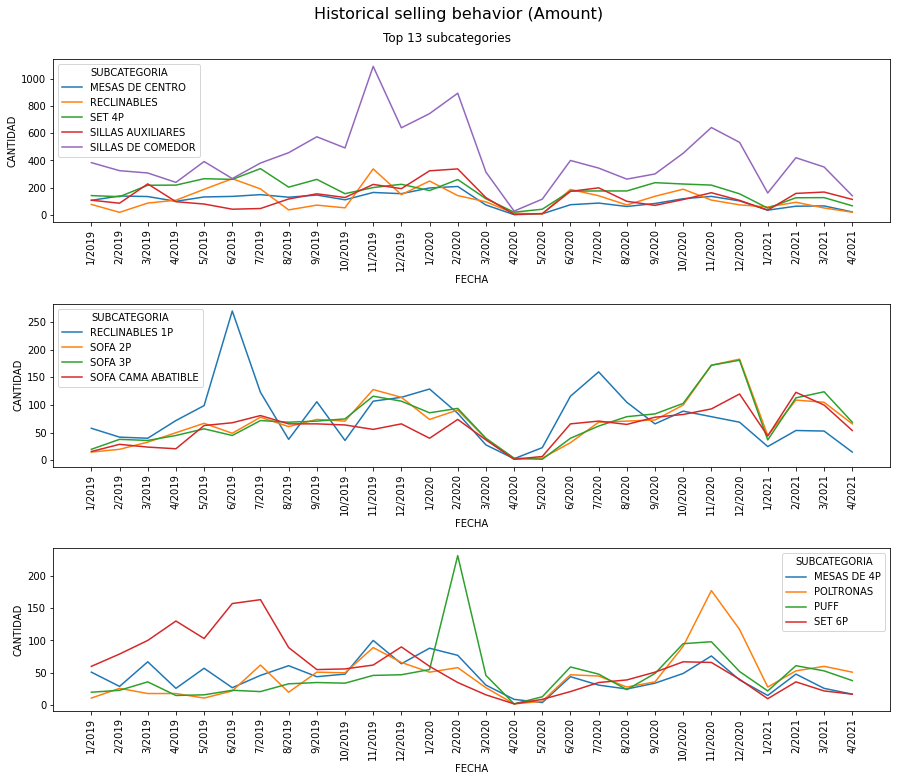

In [17]:
fig, (ax1,ax2,ax3) = plt.subplots(3, 1,figsize=(15,12),gridspec_kw={'hspace':0.5})
fig.suptitle('Historical selling behavior (Amount)',fontsize=16,y=0.94)
fig.text(.43,.9,'Top 13 subcategories', fontsize=12)

top5 = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[:5])]
top5 = top5.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top5["FECHA"] = top5.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax1,data=top5, x="FECHA", y="CANTIDAD", hue="SUBCATEGORIA")
ax1.tick_params(axis='x', labelrotation=90)

top9 = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[5:9])]
top9 = top9.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top9["FECHA"] = top9.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax2,data=top9, x="FECHA", y="CANTIDAD", hue="SUBCATEGORIA")
ax2.tick_params(axis='x', labelrotation=90)

topRest = sales_prod[sales_prod["SUBCATEGORIA"].isin(subcategories_list[9:15])]
topRest = topRest.groupby(by=["MES", "ANIO", "SUBCATEGORIA"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
topRest["FECHA"] = topRest.apply(lambda x: str(x["MES"])+"/"+str(x["ANIO"]) ,axis=1)
sns.lineplot(ax=ax3,data=topRest, x="FECHA", y="CANTIDAD", hue="SUBCATEGORIA")
ax3.tick_params(axis='x', labelrotation=90)

plt.show()

As of this point, it's still not clear if each element hsa particular trend or relevant pattern. Nonetheless, it seems that on september each year perople are more willing to buy furniture for the dinning room that on other months. On the graph we can also see selling peaks for some elemnts in november due to BlackFriday.

Here we have the top 5 selling products with their respective amount sold since 2019 and a plot tracing the relation between the value of the sold elements in the portfolio and the amount sold of each of those elements.

In [18]:
res = sales_prod.groupby(['SUBCATEGORIA'])['CANTIDAD','TOTAL'].sum().sort_values(by='TOTAL',ascending=False).head(5)
res['TOTAL'] = res['TOTAL'].map('${:,.0f}'.format)
print(res)

                   CANTIDAD           TOTAL
SUBCATEGORIA                               
RECLINABLES            3222  $3,427,202,692
SET 4P                 4982  $2,304,825,080
SOFA 3P                2041  $1,501,181,507
SOFA 2P                1995  $1,291,212,242
SILLAS DE COMEDOR     11657  $1,126,930,988


In [19]:
plt.figure()
fig = px.scatter(sales_prod,
   x="CANTIDAD",
   y="TOTAL",
   color="SUBCATEGORIA",
   hover_data=['REF', 'DESC_LARGA','CATEGORIA'],
   title="\t Sales Subategories | Money vs Units"
)

fig.show(config={'staticPlot':True})

<Figure size 432x288 with 0 Axes>

![](2021-07-24_20h57_54.png)

As mentioned, we now present the most representative styles and colors in the sold portfolio, and the historical analysis on the chosen color as we want to find if the color is an important variable and has a specific impact on the products being sold. Decision also based on the fact that the predictive demand tool to develop will need to account for color variations on each product.

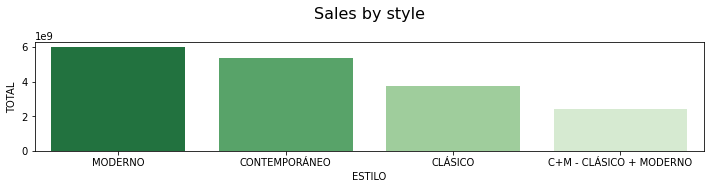

In [20]:
grafico = sales_prod.groupby('ESTILO')['TOTAL'].sum().sort_values(ascending=False).to_frame().reset_index().head(10)
fig, axes = plt.subplots(1, 1,figsize=(12,2))
sns.barplot(data=grafico, x='ESTILO', y='TOTAL', palette="Greens_r")
plt.title('Sales by style\n', fontsize=16)

plt.show()

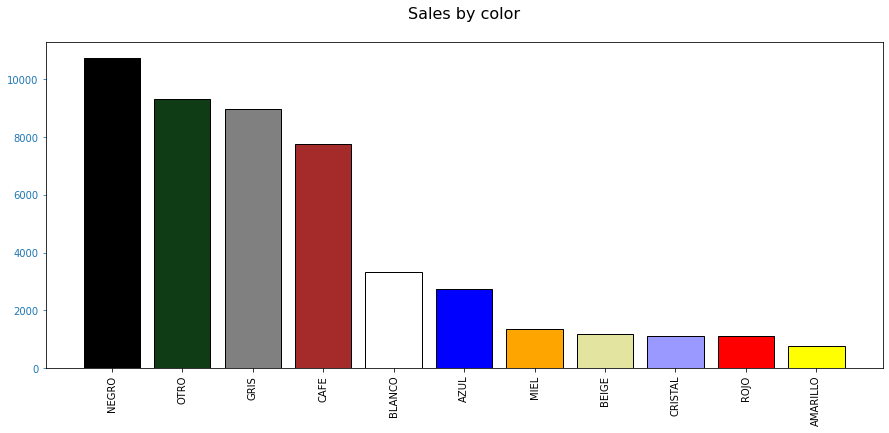

In [21]:
par_col = sales_prod[['COLOR_POS','CANTIDAD']].groupby('COLOR_POS').sum().sort_values(by = 'CANTIDAD',ascending = False)
palette = ["#000000", "#0f3c14",  "#808080", "#A52A2A", "#FFFFFF", "#0000FF", "#FFA500", "#e4e4a1", "#9999ff", "#ff0000", "#FFFF00"]

fig, ax = plt.subplots(figsize=(15,6))
ax.bar(par_col.index, par_col["CANTIDAD"], color=palette, edgecolor='black')
ax.tick_params(axis="y", colors="C0")
ax.tick_params(axis="x", labelrotation = 90)
plt.title('Sales by color\n', fontsize=16)

plt.show()

## Products to sales comparison analysis

After reviewing the behavior of the sales during th past years we saw the oportunity to check whether the finding had relevant aditional information in relation to the actual composition of the whole portfolio, and the way each subcategory realtes to the "acabado", main material, number of seats and color.

Here we have the comparable plots between the composition of the sold portfolio and the actual portfolio of the company. For each plot we can check in red the composition of the portfolio in terms of the selected variables, and in blue the composition of sold furniture during the past years in terms of the same variable.

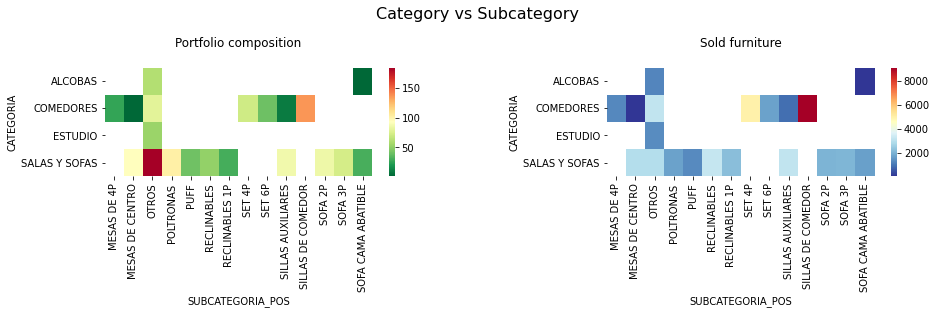

In [22]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,2),gridspec_kw={'wspace':0.5,'hspace':0.1})
fig.suptitle('Category vs Subcategory', fontsize=16, x=0.47, y=1.3)

cross = pd.crosstab(products['CATEGORIA'],products['SUBCATEGORIA_POS'])
cross.replace(0, np.nan, inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax1)
ax1.title.set_text('Portfolio composition\n')

sns.heatmap(pd.pivot_table(data=groupby_sales,index='CATEGORIA',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax2)
ax2.title.set_text('Sold furniture\n')

plt.show()

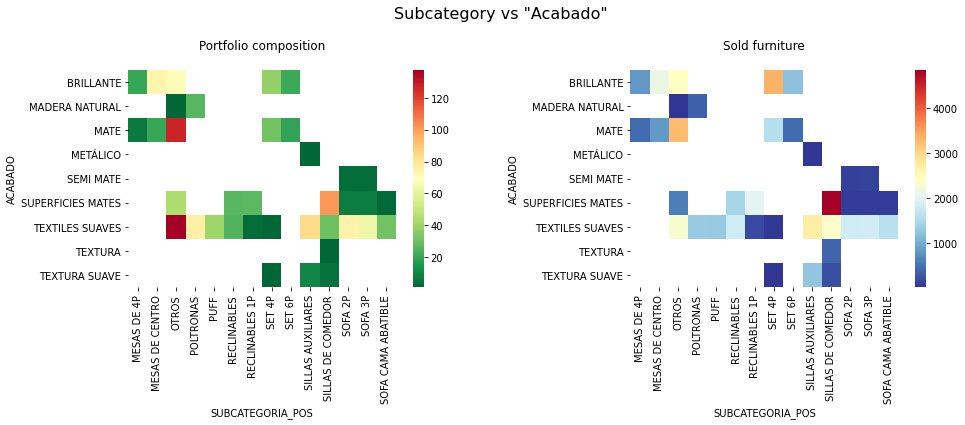

In [23]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,4),gridspec_kw={'wspace':0.5,'hspace':0.1})
fig.suptitle('Subcategory vs "Acabado"', fontsize=16, x=0.47, y=1.1)

cross = pd.crosstab(products['ACABADO'],products['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax1)
ax1.title.set_text('Portfolio composition\n')

sns.heatmap(pd.pivot_table(data=groupby_sales,index='ACABADO',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax2)
ax2.title.set_text('Sold furniture\n')

plt.show()

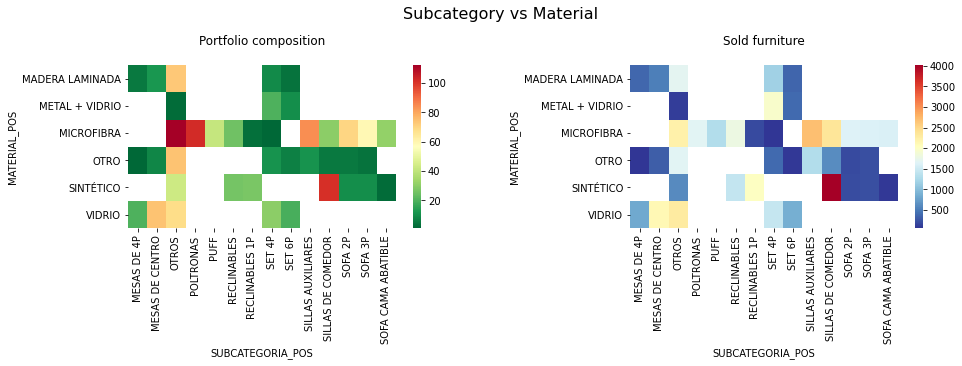

In [24]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,3),gridspec_kw={'wspace':0.5,'hspace':0.1})
fig.suptitle('Subcategory vs Material', fontsize=16, x=0.47, y=1.15)

cross = pd.crosstab(products['MATERIAL_POS'],products['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,fmt='g',ax=ax1)
ax1.title.set_text('Portfolio composition\n')

sns.heatmap(pd.pivot_table(data=groupby_sales,index='MATERIAL_POS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax2)
ax2.title.set_text('Sold furniture\n')

plt.show()

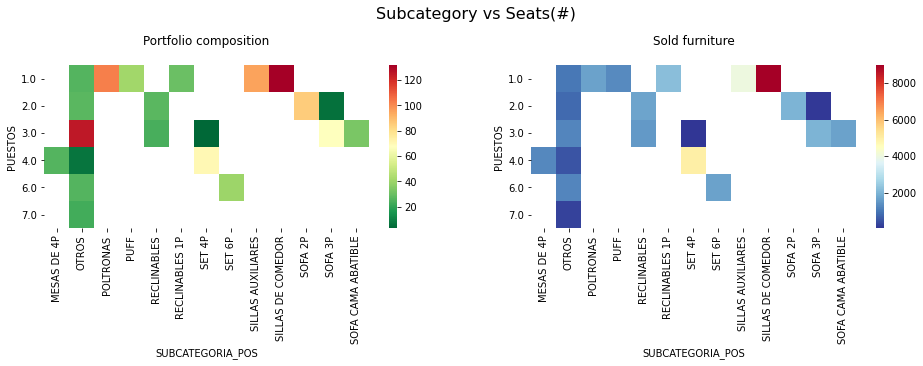

In [25]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(16,3),gridspec_kw={'wspace':0.2,'hspace':0.1})
fig.suptitle('Subcategory vs Seats(#)', fontsize=16, x=0.5, y=1.15)

cross = pd.crosstab(products['PUESTOS'],products['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,fmt='g',ax=ax1)
ax1.title.set_text('Portfolio composition\n')
ax1.tick_params(axis='y', labelrotation=360)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='PUESTOS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax2)
ax2.title.set_text('Sold furniture\n')
ax2.tick_params(axis='y', labelrotation=360)

plt.show()

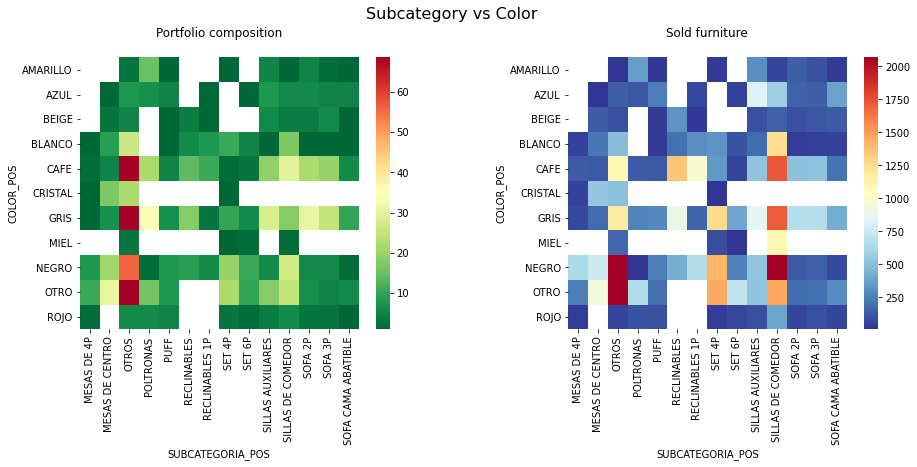

In [26]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,5),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

cross = pd.crosstab(products['COLOR_POS'],products['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax1)
ax1.title.set_text('Portfolio composition\n')

sns.heatmap(pd.pivot_table(data=groupby_sales,index='COLOR_POS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax2)
ax2.title.set_text('Sold furniture\n')

plt.show()


By checking the previous tables we see that for the most trending subcategories, classified by colors, materials, "acabados" and the number of seats; the portfolio behaves similar to the number of sales. We could argue that the seen correlation between both behaviors is explained due to the fact that the probability of buying an element of a certain color, material, "acabado" or amount of seats, depends much on how many possibilities the customer has when choosing one of those characteristics. That is why the most sold characteristics are the most diverse.

## Extra correlations

Following, we have some other data of the portfolio such as the correlation matrix between amount sold, value sold, price, discount, measures, and the number of seats to assert the considered relation between the price and the measurements and number of seats.

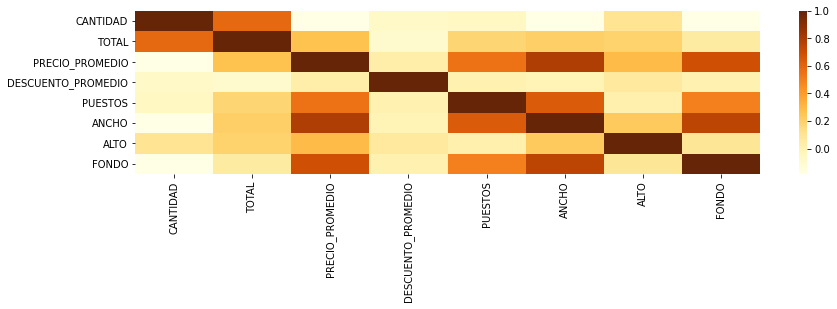

In [27]:
fig,ax = plt.subplots(figsize=(14,3))
sns.heatmap(groupby_sales.dropna(subset=['PUESTOS']).drop(columns='ITEM').corr(),cmap='YlOrBr')

plt.show()

In here we can see, as expected, that there is a high correlation between total sale price and the amount of products sold,the average price and the dimensions of the product. Making it clear that even though those variables affect the price they are not relevant to further analysis.

Other variables, on the contrary, seem to have certain impact on the sales behavior and should be taken into consideratin for modeling a proper statistical predictive tool. Here we have some:

### Validity (`vigencia`)

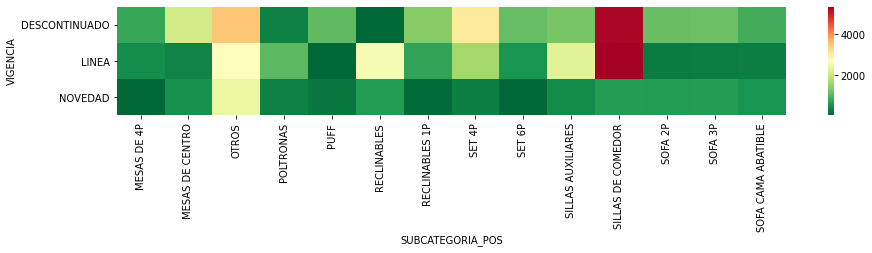

In [28]:
fig,ax=plt.subplots(figsize=(15,2))

pivot = pd.pivot_table(data=groupby_sales,columns='SUBCATEGORIA_POS',index='VIGENCIA',values='CANTIDAD',aggfunc='sum')
sns.heatmap(pivot,cmap='RdYlGn_r', robust=True)

plt.show()

## Style (`estilo`)

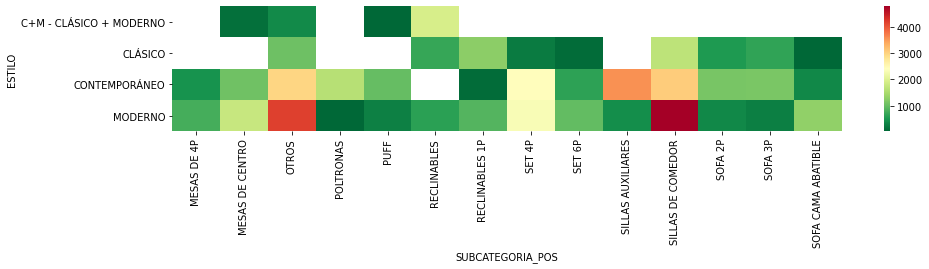

In [29]:
fig,ax=plt.subplots(figsize=(15,2.3))

pivot = pd.pivot_table(data=groupby_sales,columns='SUBCATEGORIA_POS',index='ESTILO',values='CANTIDAD',aggfunc='sum')
sns.heatmap(pivot,cmap='RdYlGn_r',robust=True)

plt.show()

## Historical sales analysis by features

For the next part of the analysis we created a time series to review the behavior of certain features of the furtinute over time. First we start by reviewing colors, then materials, then "acabados" and finally number of seats. For each of these features we only use the 13 top selling categories that represent 80% of the sold portfolio. Finally is worth to mention that for each plot we are only reviewing the amount of units sold and not the total sales value.

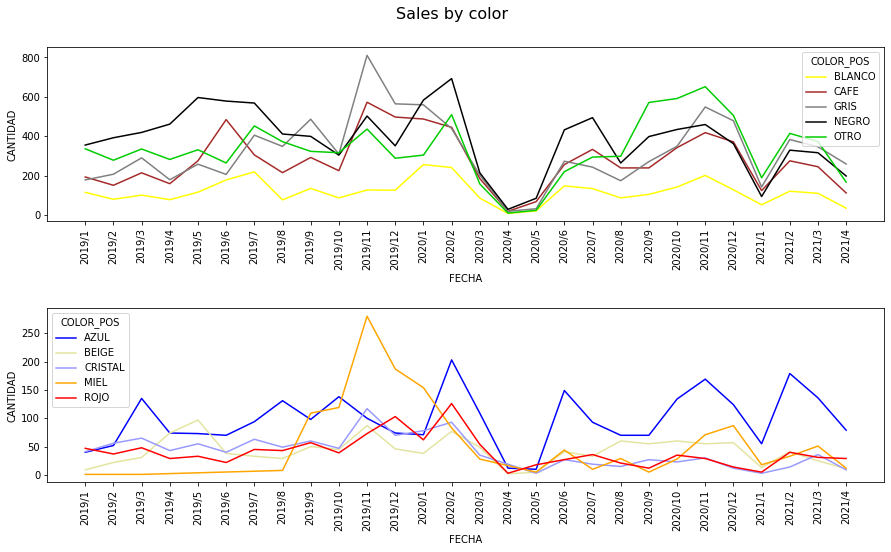

In [30]:
fig, (ax1,ax2) = plt.subplots(2, 1,figsize=(15,8), gridspec_kw={'hspace':0.5})
fig.suptitle('Sales by color\n', fontsize=16, y=0.95)

top_color_5 = sales_prod[sales_prod["COLOR_POS"].isin(par_col.index[:5])]
top_color_5 = top_color_5.groupby(by=["MES", "ANIO", "COLOR_POS"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_color_5["FECHA"] = top_color_5.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)
sns.lineplot(ax=ax1,data=top_color_5, x="FECHA", y="CANTIDAD", hue="COLOR_POS", palette =["#FFFF00","#A52A2A","#808080","#000000","#00CD00"])
ax1.tick_params(axis='x', labelrotation=90)

top_color_10 = sales_prod[sales_prod["COLOR_POS"].isin(par_col.index[5:10])]
top_color_10 = top_color_10.groupby(by=["MES", "ANIO", "COLOR_POS"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_color_10["FECHA"] = top_color_10.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)
sns.lineplot(ax=ax2,data=top_color_10, x="FECHA", y="CANTIDAD", hue="COLOR_POS", palette = ["#0000FF","#e4e4a1","#9999ff","#FFA500","#ff0000"])
ax2.tick_params(axis='x', labelrotation=90)

plt.show()

In the previous graph we can see a similar behavior on all colors with peaks over the last months of the year. Nonetheless no further information is provided that could indicate a prevalence of a specific color in a certain period of time. most colors behave the same way with black, gray and brown being the most sold colors. Here we can also confirm the efects of the confinement decreed during the first months of the pandemic and their efect over the sales. 

To further investigate the relevance of certain features over diferent periods of time we can see the historical sales of different materials, where `laminated wood` and `metal + glass` are the top selling materials, with a mean sales average over 500 units per month, and the rest of the colors falling behind bellow the 200 line.

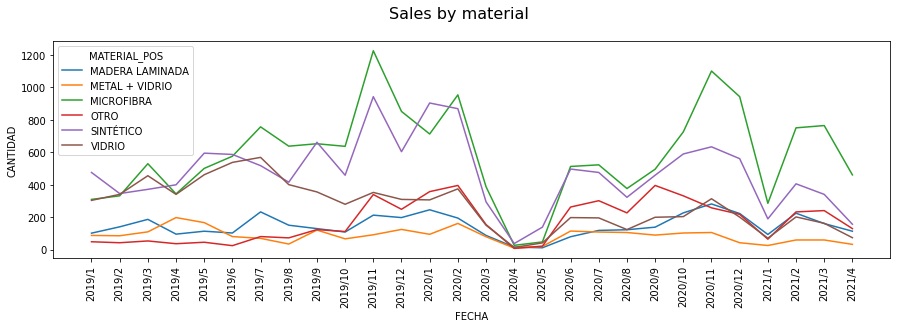

In [31]:
par_mat = groupby_sales[['MATERIAL_POS','CANTIDAD']].groupby('MATERIAL_POS').sum().sort_values(by = 'CANTIDAD',ascending = False)

top_5 = sales_prod[sales_prod["MATERIAL_POS"].isin(par_mat.index)]
top_5 = top_5.groupby(by=["MES", "ANIO", "MATERIAL_POS"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_5["FECHA"] = top_5.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)

fig, ax1 = plt.subplots(1, 1,figsize=(15,4), gridspec_kw={'hspace':0.5})
fig.suptitle('Sales by material\n', fontsize=16, y=1)

sns.lineplot(ax=ax1,data=top_5, x="FECHA", y="CANTIDAD", hue="MATERIAL_POS")
ax1.tick_params(axis='x', labelrotation=90)

plt.show()

Next we have the historical behavior of the finishing materials of the different units. In here the range is really broad with `soft textures` having sold units over the 600 average, and `metal` texture bellow the 10 average sold units.

In [ ]:
par_mat = groupby_sales[['ACABADO','CANTIDAD']].groupby('ACABADO').sum().sort_values(by = 'CANTIDAD',ascending = False)

fig, (ax1,ax2) = plt.subplots(2, 1,figsize=(15,8), gridspec_kw={'hspace':0.5})
fig.suptitle('Sales by "acabado"\n', fontsize=16, y=0.95)

top_5 = sales_prod[sales_prod["ACABADO"].isin(par_mat.index[:5])]
top_5 = top_5.groupby(by=["MES", "ANIO", "ACABADO"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_5["FECHA"] = top_5.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)
sns.lineplot(ax=ax1,data=top_5, x="FECHA", y="CANTIDAD", hue="ACABADO")
ax1.tick_params(axis='x', labelrotation=90)

top_color_10 = sales_prod[sales_prod["ACABADO"].isin(par_mat.index[5:10])]
top_color_10 = top_color_10.groupby(by=["MES", "ANIO", "ACABADO"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_color_10["FECHA"] = top_color_10.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)
sns.lineplot(ax=ax2,data=top_color_10, x="FECHA", y="CANTIDAD", hue="ACABADO")
ax2.tick_params(axis='x', labelrotation=90)

plt.show()

Finally we have the historical behavior of the `number of seats` feature with a similar behavior as the other features. Although they have diferent sale amounts on every posible value, that is explained by the composition of the portfolio and not attributable to a certain relation between a specific month and the values of the feature. No single value of any of these features has a month where it's behavior changes in a relevant manner to identify a substancial change in the analysis.

In [ ]:
par_mat = groupby_sales[['PUESTOS','CANTIDAD']].groupby('PUESTOS').sum().sort_values(by = 'CANTIDAD',ascending = False)

fig, ax1 = plt.subplots(1, 1,figsize=(15,4), gridspec_kw={'hspace':0.5})
fig.suptitle('Sales by seats\n', fontsize=16, y=1)

top_5 = sales_prod[sales_prod["PUESTOS"].isin(par_mat.index)]
top_5 = top_5.groupby(by=["MES", "ANIO", "PUESTOS"])["CANTIDAD"].sum().to_frame().reset_index().sort_values(by=['ANIO','MES'])
top_5["FECHA"] = top_5.apply(lambda x: str(x["ANIO"])+"/"+str(x["MES"]) ,axis=1)
sns.lineplot(ax=ax1,data=top_5, x="FECHA", y="CANTIDAD", hue="PUESTOS", palette='tab10')
ax1.tick_params(axis='x', labelrotation=90)

plt.show()

Due to the previous findings, we opted for a different approach by evaluating a classification procedure to review possible patterns that cannot be easily identifiable by graphing the different numeric and categorical variables as we previously did. For this, we decided on a Demand Classification method.

## Demand classification

The Forecast accuracy of any model strongly depends on your product forecastability, and we can find evidence of it in the demand history characteristics previously reviewed in the sales analysis section.

In this case then, to be able to determine a product forecastability, we use the <a href="https://frepple.com/blog/demand-classification/">demand calssification</a> process. For this we apply two coefficients to the different products to check whether the product can be classified as high/low variable. These coeficients are:

* the Average Demand Interval **(ADI)**. It measures the demand regularity in time by computing the average interval between two demands.
* the square of the Coefficient of Variation **(CV²)**. It measures the variation in quantities.

Based on these 2 dimensions, the literature classifies the demand profiles into 4 different categories:

* **Smooth demand (ADI < 1.32 and CV² < 0.49)**. The demand is very regular in time and in quantity. It is therefore easy to forecast and you won’t have trouble reaching a low forecasting error level. 
* **Intermittent demand (ADI >= 1.32 and CV² < 0.49)**. The demand history shows very little variation in demand quantity but a high variation in the interval between two demands. Though specific forecasting methods tackle intermittent demands, the forecast error margin is considerably higher.
* **Erratic demand (ADI < 1.32 and CV² >= 0.49)**. The demand has regular occurrences in time with high quantity variations. Your forecast accuracy remains shaky.
* **Lumpy demand (ADI >= 1.32 and CV² >= 0.49)**. The demand is characterized by a large variation in quantity and in time. It is actually impossible to produce a reliable forecast, no matter which forecasting tools you use. This particular type of demand pattern is unforecastable.

Lets see the results applyed to our historical product sales on the 16 pareto subcategories previously chosen:

In [ ]:
demand = sales_prod[sales_prod['VIGENCIA']!='DESCONTINUADO'].copy()

demand['YY_MM'] = demand['FECHA'].dt.strftime('%y-%m')
demand = demand.groupby(['PROD_REF','YY_MM'])['CANTIDAD'].sum().reset_index()
demand = demand.pivot(index='PROD_REF',columns='YY_MM').fillna(0)

demand['N_LAST'] = demand.apply(lambda x: np.where(x)[0][-1] ,axis=1)+1
demand['LAST'] = demand.apply(last_first, axis=1)
demand['N_FIRST'] = demand.apply(lambda x: np.where(x)[0][0] ,axis=1)+1
demand['FIRST'] = demand.apply(lambda x: demand.columns[np.where(x)[0][0]][1] ,axis=1)

demand['PERIODOS'] = demand['N_LAST']-demand['N_FIRST']+1
demand['PER_SIN_INFO'] = len(demand.columns)-5-demand['N_LAST']

In [ ]:
v0 = demand[demand.columns[0:28]].values
v1 = np.where(v0 > 0, v0, np.nan)
demand['PERIODOS'] = np.count_nonzero(v1>0, axis=1)
demand['ADI'] = np.count_nonzero(v1, axis=1)/np.count_nonzero(v1>0, axis=1)
demand['CV2'] = (np.nanstd(v1, axis=1)/np.nanmean(v1, axis=1))**2

demand2 = demand.set_axis(demand.columns.map(''.join), axis=1, inplace=False).reset_index()
demand2 = demand2[['PROD_REF','N_LAST','LAST','N_FIRST','FIRST','PERIODOS','PER_SIN_INFO','ADI','CV2']]
demand2 = demand2.merge(groupby_sales, how='left',left_on='PROD_REF',right_on='REF')

In [ ]:
plt.figure()
fig = px.scatter(demand2,
           x="CV2", y="ADI", color="SUBCATEGORIA_POS",
           hover_data=['CATEGORIA','SUBCATEGORIA_POS','PROD_REF', 'DESC_LARGA',],
           title="\t DEMAND CLASIFICATION")

# add two horizontal lines
fig.add_hline(y=1.32, line_dash="dot", line_width=2,  line_color="black")
fig.add_vline(x=0.49, line_dash="dot", line_width=2,  line_color="black")

fig.add_annotation(text="INTERMITTENT", x=0.1, y=20, showarrow=False)
fig.add_annotation(text="LUMPY", x=2, y=20, showarrow=False)
fig.add_annotation(text="SMOOTH", x=0.1, y=0.5, showarrow=False)
fig.add_annotation(text="ERRATIC", x=2, y=0.5, showarrow=False)

fig.show(config={'staticPlot':True})

![](2021-07-24_20h59_09.png)

In the graph we can visualice the deman calsification for Furni, where most of the products of the 16 pareto subcategories are clasified between intermitent and lumpy. This in turn indicates a patterns of high unstable variation of the amount of sales, and low and high variation on the interval frequency where the products are sold. With such informaton a simple objective to fulfill would be to migrate the behavior of the product sales to a more smoth clasification, with low variation in frecuency and amounts.

For the intemittent products we can evaluate possible strategies of periodicity and buy back. As the variability in amount is some how stable a stock buffer could be created on a stable demand basis. instead, for the lumpy products we could evaluate the portfolio clasification and the validity of the products to determine if some products could be removed from the portfolio or if they should sell on an on-demand or seasonal basis. 

# Stock sales comparative analysis

Part of the analysis finally relates to the clients' requirement to predict the demand of products to enable a better stock composition and reduce costs by optimizing stock management. To relate the previously gathered information with the way the stock should behave and be composed monthly, we also require a compared analysis between the historical sales and the current stock.

For this, we will evaluate the behavior of sales versus the current inventory of the company. In there we will try to identify if the inventory is consistent with the composition of the sales for these characteristics. The idea is to identify which features and characteristics are understocked, overstocked, or on point. And review if some of those results are due to the variation in demand over time.

In [ ]:
aux1=stock_prod.groupby(['ORIGEN'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux2=stock_prod.groupby(['ESTILO'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux3=stock_prod.groupby(['VIGENCIA'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux4=stock_prod.groupby(['ACABADO'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux45=stock_prod.groupby(['MATERIAL_POS'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux5=stock_prod.groupby(['COLOR_POS'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
aux6=stock_prod.groupby(['PUESTOS'])['CANTIDAD'].sum().sort_values(ascending=False).to_frame().head(10)
display_side_by_side(aux1,aux2,aux3,aux4,aux45,aux5,aux6)

**1. Category**

In [ ]:
a = stock_prod.groupby('CATEGORIA')['CANTIDAD'].sum().to_frame().reset_index()

f, ax = plt.subplots(2,2, figsize=(15,15))
ax[1,0].set_visible(False)
ax[1,1].set_visible(False)

ax[0,0].set_title('Stock Product by Category')
ax[0,0].tick_params(labelrotation=90)
sns.countplot(x="CATEGORIA", data=stock, palette="YlOrBr", ax=ax[0,0])

ax[0,1].set_title('Stock Units by Category')
ax[0,1].tick_params(labelrotation=90)
sns.barplot(x="CATEGORIA", y='CANTIDAD', data=a, palette="YlOrBr",ax=ax[0,1])

plt.show()

**2. Subcategory**

In [ ]:
a = stock_prod.groupby('SUBCATEGORIA_POS')['CANTIDAD'].sum().sort_values(ascending=False).to_frame().reset_index().head(10)

f, ax = plt.subplots(2,2, figsize=(15,15))
ax[1,0].set_visible(False)
ax[1,1].set_visible(False)

ax[0,0].set_title('Stock Product by Subcategory')
ax[0,0].tick_params(labelrotation=90)
sns.countplot(x="SUBCATEGORIA_POS", data=stock_prod, palette="YlOrBr", order = stock_prod['SUBCATEGORIA_POS'].value_counts().head(10).index, ax=ax[0,0])

ax[0,1].set_title('Stock Units by Subcategory')
ax[0,1].tick_params(labelrotation=90)
sns.barplot(x="SUBCATEGORIA_POS", y='CANTIDAD', data=a, palette="YlOrBr",ax=ax[0,1])

plt.show()

**3. Frequency Tables Category|Subcategory**

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,2),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='CATEGORIA',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax1)
ax1.title.set_text('Sold furniture\n')

cross = pd.crosstab(stock_prod['CATEGORIA'], stock_prod['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax2)
ax2.title.set_text('Stock composition\n')

plt.show()

**4. Subsubcategories_list vs other variables.**

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,4),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='ACABADO',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax1)
ax1.title.set_text('Sold furniture\n')

cross = pd.crosstab(stock_prod['ACABADO'], stock_prod['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax2)
ax2.title.set_text('Stock composition\n')

plt.show()

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,2),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='MATERIAL_POS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax1)
ax1.title.set_text('Sold furniture\n')

cross = pd.crosstab(stock_prod['MATERIAL_POS'], stock_prod['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax2)
ax2.title.set_text('Stock composition\n')

plt.show()

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,2),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='PUESTOS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax1)
ax1.title.set_text('Sold furniture\n')
ax1.tick_params(axis='y', labelrotation=360)

cross = pd.crosstab(stock_prod['PUESTOS'], stock_prod['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax2)
ax2.title.set_text('Stock composition\n')
ax2.tick_params(axis='y', labelrotation=360)

plt.show()

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,4),gridspec_kw={'wspace':0.4,'hspace':0.1})
fig.suptitle('Subcategory vs Color', fontsize=16, x=0.47, y=1.02)

sns.heatmap(pd.pivot_table(data=groupby_sales,index='COLOR_POS',columns='SUBCATEGORIA_POS',values='CANTIDAD',aggfunc='sum'),cmap='RdYlBu_r',robust=True,ax=ax1)
ax1.title.set_text('Sold furniture\n')

cross = pd.crosstab(stock_prod['COLOR_POS'], stock_prod['SUBCATEGORIA_POS'])
cross.replace(0,np.nan,inplace=True)
sns.heatmap(cross,cmap='RdYlGn_r',robust=True,ax=ax2)
ax2.title.set_text('Stock composition\n')

plt.show()

# Conclusions

During this EDA analysis we explored the data given by the client, we created extra tables by merging the information we needed from the initial tables, we then cleaned the information to have a standardized format for all tables and values and then started the analysis to find additional information on the data to be able to gather insights on the problem at hand.

From the information, we plotted several line plots, scatter plots, and heatmaps to identify possible patterns and relations of the different variables, categorical or numerical. Some of that related information between the historical sales and the portfolio, and, the historical sales and the stock. From there we identified that there is a close relationship between the sales and the portfolio due mainly to the diversity of the products offered by the company. To higher diversity in colors, materials, texture, number of seats and category; higher number of sales of said subcategories (positive correlation). Finally, we determined the relevant features to take into consideration for the predictive model to implement.

From there, we decided to review possible trends of the relevant features in the historical sales, to check whether or not the different characteristics had a particular effect on the total amount of sales of the Pareto subcategories that comprised 80% of the sold portfolio. We grouped sales by different variables with no clear patterns observed. On the contrary, the only new information gathered was the relation between the number of sales by characteristic and the portfolio: to higher diversity of items for each feature the higher amount of sales. To improve this information we decided to reduce the dimensionality of several variables by conducting a Pareto test according to the influence on the sales. Similar results were observed thus confirming the previous results and excluding possible confounding variables on the process, such as dimensions -though they do affect the price average of the products-.

We then identified the possibility to generate a classification strategy on the portfolio concerning the sales behavior between sales frequency and sale quantity fluctuation. We decided to go on with the Demand Driven methodology to inspect whether the products behave on a certain pattern -Intermittent, Lumpy, Smooth, Erratic- or not. From those results, we hope to properly classify the portfolio and be able to generate marketing and stocking strategies. We also identified possibilities to improve the validity of the portfolio by reviewing the composition of discontinued and new products and it's relation to the whole portfolio.

Therefore, we expect to have created a stable base to correctly predict the demand and optimize the stock of the client.


# Mockup frontend

![](mockup.png)

In [ ]:
data = [products,sales,stock,sales_prod,stock_prod,groupby_sales,pd.DataFrame(subcategories_list),pd.DataFrame(materials_list)]
names = ['products_clean','sales_clean','stock_clean','sp_clean','stp_clean','gb_sales_clean','subc_list_clean','mat_list_clean']

for element,name in zip(data,names):
    element.to_csv('Proyecto/Data/'+name+'.csv')
